In [2]:
import pandas as pd
import numpy as np

In [3]:
data = pd.read_csv('energy_load_pt.csv')

In [4]:
data.head()

,datetime,load
0,2020-11-17 08:00:00,5159.0
1,2020-11-17 09:00:00,4985.0
2,2020-11-17 10:00:00,4717.0
3,2020-11-17 11:00:00,4356.0
4,2020-11-17 12:00:00,4086.0


In [5]:
data.shape

(13104, 2)

<AxesSubplot:xlabel='datetime'>

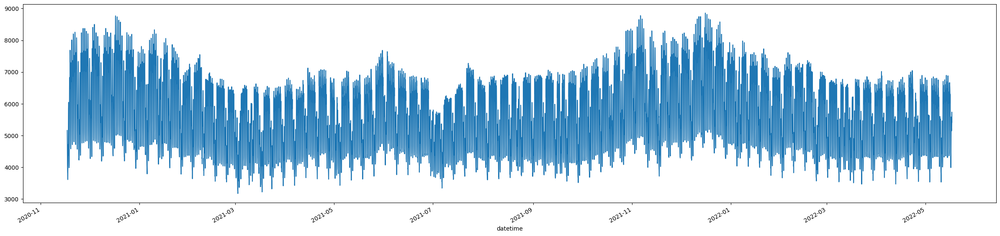

In [6]:
series = pd.Series(data['load'])
series.index = pd.to_datetime(data['datetime'])
series.plot(figsize=(30,7))

<AxesSubplot:xlabel='datetime'>

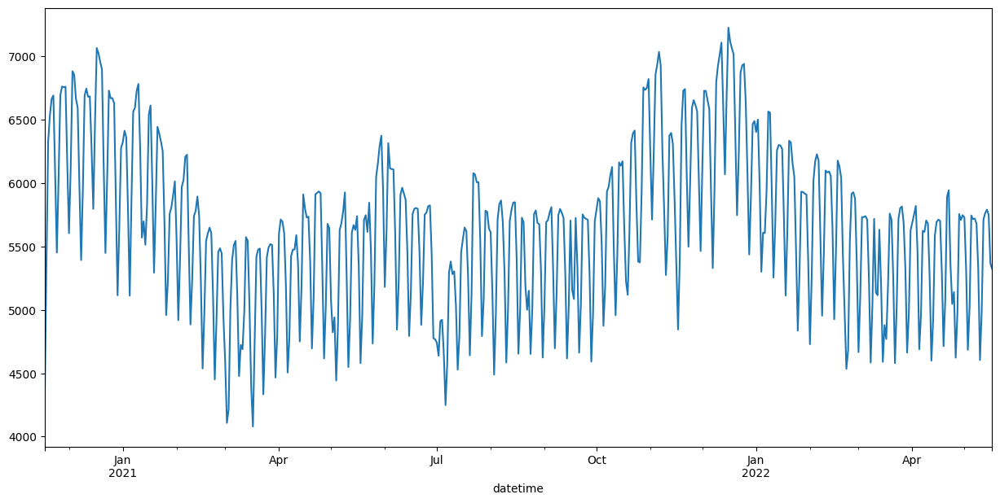

In [7]:
series.resample('D').mean().plot(figsize=(15,7))

In [169]:
series = series.resample('D').mean()
series.head(7)

datetime
2020-11-17    4294.687500
2020-11-18    5373.125000
2020-11-19    6329.000000
2020-11-20    6538.708333
2020-11-21    6666.208333
2020-11-22    6692.583333
2020-11-23    6088.666667
Freq: D, Name: load, dtype: float64

In [170]:
series.tail(7)

datetime
2022-05-11    4997.416667
2022-05-12    5713.208333
2022-05-13    5763.750000
2022-05-14    5791.000000
2022-05-15    5750.458333
2022-05-16    5365.791667
2022-05-17    5323.111111
Freq: D, Name: load, dtype: float64

In [171]:
from pmdarima.arima import ndiffs, nsdiffs

#teste tendencia com kpss 
ndiffs(series, test='kpss')

1

In [172]:
#augmented dickey-fuller
ndiffs(series, test='adf')

1

In [173]:
# testes para sazonalidade
nsdiffs(series, test='ocsb', m=365)

0

In [174]:
nsdiffs(series, test='ch', m=365)

0

<AxesSubplot:xlabel='datetime'>

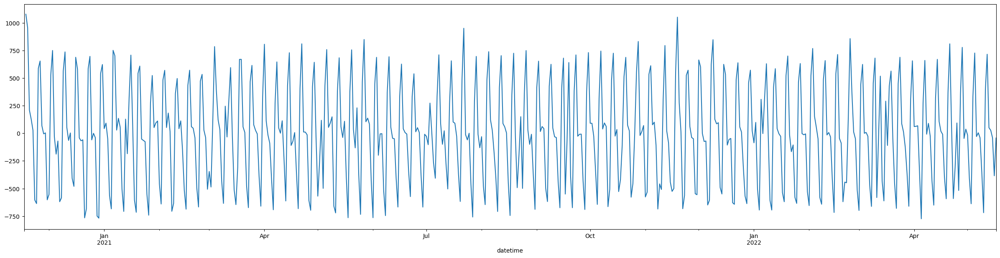

In [177]:
# removendo a tendencia
series.diff(periods=1).plot(figsize=(30,7))

<AxesSubplot:xlabel='datetime'>

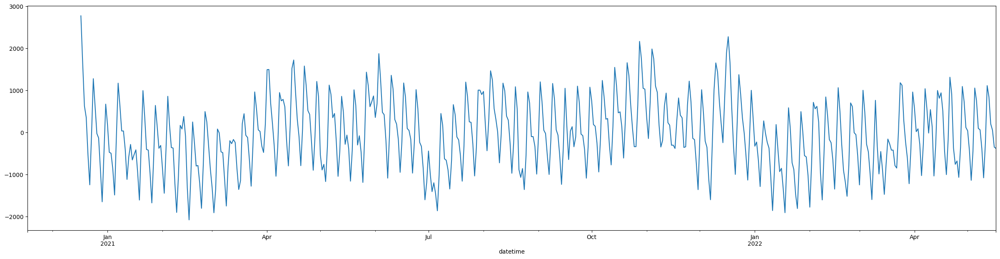

In [180]:
# removendo a sazonalidade
series.diff(periods=30).plot(figsize=(30,7))

<AxesSubplot:xlabel='datetime'>

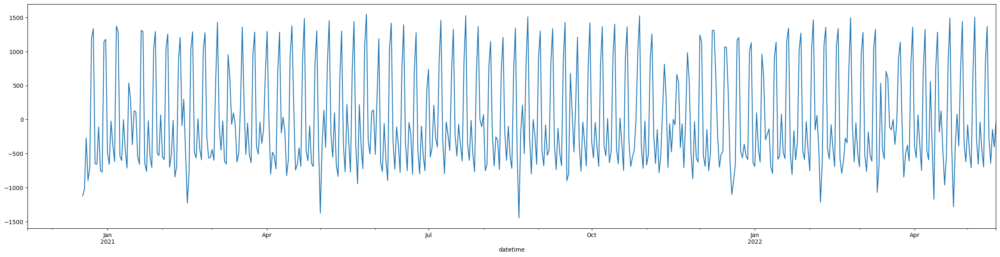

In [16]:
# residuos
series.diff(periods=1).diff(periods=30).plot(figsize=(30,7))

<AxesSubplot:xlabel='datetime'>

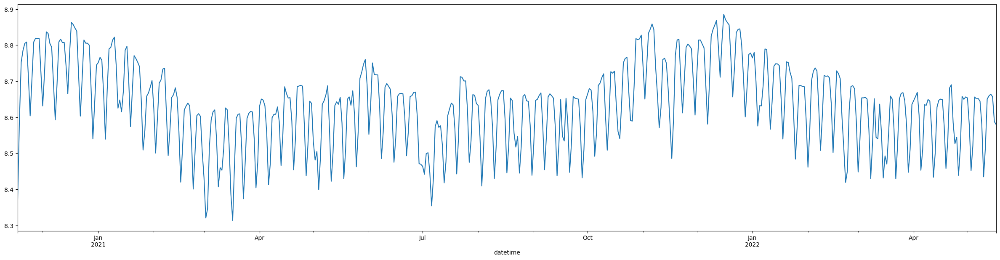

In [17]:
series_log = np.log(series)

series_log.plot(figsize=(30,7))

datetime
2020-11-17    4294.687500
2020-11-18    5373.125000
2020-11-19    6329.000000
2020-11-20    6538.708333
2020-11-21    6666.208333
                 ...     
2022-05-13    5763.750000
2022-05-14    5791.000000
2022-05-15    5750.458333
2022-05-16    5365.791667
2022-05-17    5323.111111
Freq: D, Name: load, Length: 547, dtype: float64


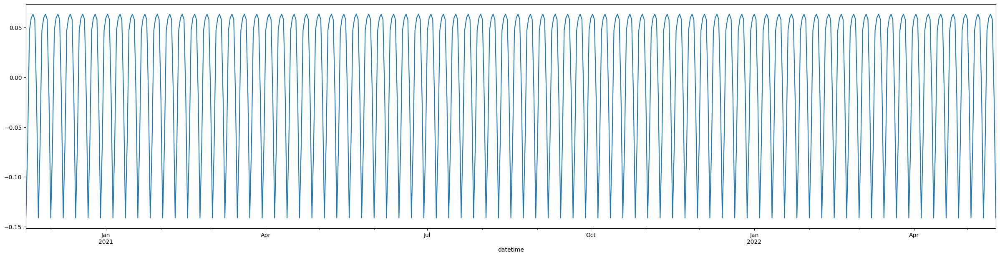

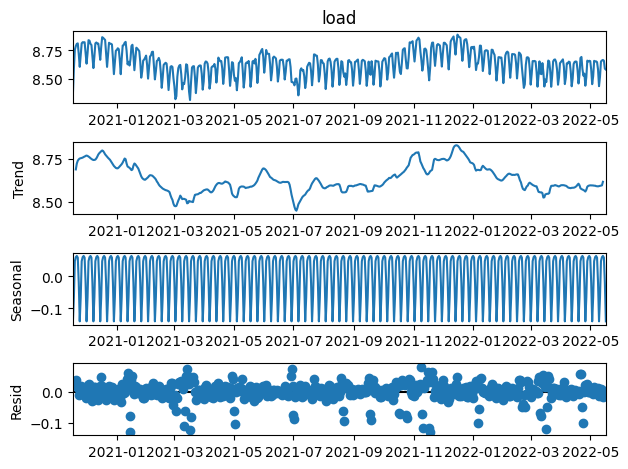

In [59]:
from statsmodels.tsa.seasonal import seasonal_decompose

print(np.exp(series_log))

result = seasonal_decompose(np.log(series),
                            model='add',
                            period=7)

result.seasonal.plot(figsize=(30,7))

plt = result.plot()

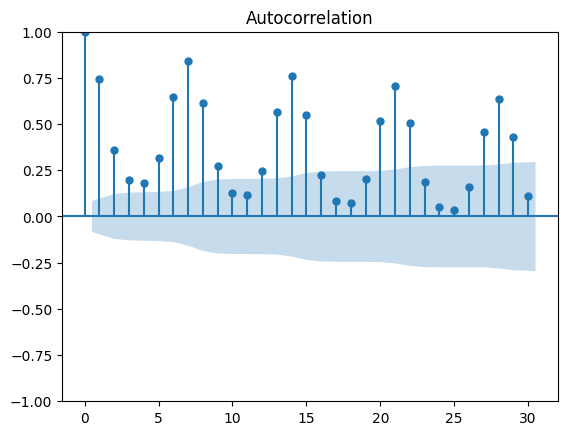

In [60]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plt = plot_acf(series, lags=30)

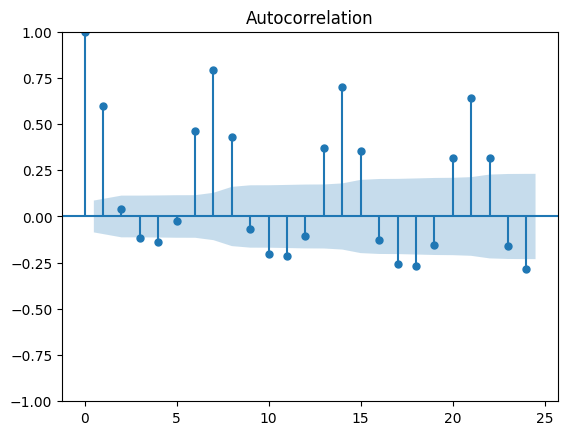

In [61]:
plt = plot_acf(series.diff(periods=30)[30:], lags=24)

MODELOS

In [62]:
# divisao entre treino e validacao
from sklearn.model_selection import train_test_split

train, test = train_test_split(series, shuffle=False, test_size=0.2)

In [63]:
train.head()

datetime
2020-11-17    4294.687500
2020-11-18    5373.125000
2020-11-19    6329.000000
2020-11-20    6538.708333
2020-11-21    6666.208333
Freq: D, Name: load, dtype: float64

In [64]:
train.tail()

datetime
2022-01-23    6049.958333
2022-01-24    5470.708333
2022-01-25    4836.083333
2022-01-26    5301.375000
2022-01-27    5933.000000
Freq: D, Name: load, dtype: float64

In [65]:
test.head()

datetime
2022-01-28    5930.208333
2022-01-29    5916.916667
2022-01-30    5911.416667
2022-01-31    5383.500000
2022-02-01    4728.833333
Freq: D, Name: load, dtype: float64

In [66]:
test.tail()

datetime
2022-05-13    5763.750000
2022-05-14    5791.000000
2022-05-15    5750.458333
2022-05-16    5365.791667
2022-05-17    5323.111111
Freq: D, Name: load, dtype: float64

In [67]:
test.shape

(110,)

In [68]:
import pmdarima as pm

model = pm.auto_arima(train, m=7, trace=True, suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[7] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=6571.036, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=6005.750, Time=0.46 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=6196.706, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=6569.067, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=6534.759, Time=0.05 sec
 ARIMA(1,1,0)(2,0,0)[7] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,1,0)(1,0,1)[7] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,0)(0,0,1)[7] intercept   : AIC=6295.876, Time=0.19 sec
 ARIMA(1,1,0)(2,0,1)[7] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(1,0,0)[7] intercept   : AIC=6016.034, Time=0.13 sec
 ARIMA(2,1,0)(1,0,0)[7] intercept   : AIC=5944.264, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[7] intercept   : AIC=6381.787, Time=0.08 sec
 ARIMA(2,1,0)(2,0,0)[7] intercept   : AIC=5867.846, Time=1.26 sec
 ARIMA(2,1,0)(2,0,1)[7] intercept   : AIC=inf, Time=1

In [69]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  437
Model:             SARIMAX(5, 1, 0)x(1, 0, [1], 7)   Log Likelihood               -2891.672
Date:                             Sun, 21 Jul 2024   AIC                           5801.345
Time:                                     13:21:45   BIC                           5838.043
Sample:                                 11-17-2020   HQIC                          5815.828
                                      - 01-27-2022                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.2447      1.933      1.161      0.245      -1.543       6.033
ar.L1          0.2986      0.057      5.262      0.000       0.187       0.410
ar.L2         -0.4994      0.053     -9.450      0.000      -0.603      -0.396
ar.L3          0.1650      0.083      1.979      0.048       0.002       0.329
ar.L4         -0.2891      0.066     -4.362      0.000      -0.419      -0.159
ar.L5          0.0323      0.064      0.506      0.613      -0.093       0.158
ar.S.L7        0.9853      0.008    125.140      0.000       0.970       1.001
ma.S.L7       -0.7549      0.046    -16.360      0.000      -0.845      -0.664
sigma2      4.257e+04   2258.941     18.847      0.000    3.81e+04     4.7e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):               420.53
Prob(Q):                              0.78   Prob(JB):                         0.00
Heteroskedasticity (H):               1.34   Skew:                            -0.92
Prob(H) (two-sided):                  0.08   Kurtosis:                         7.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

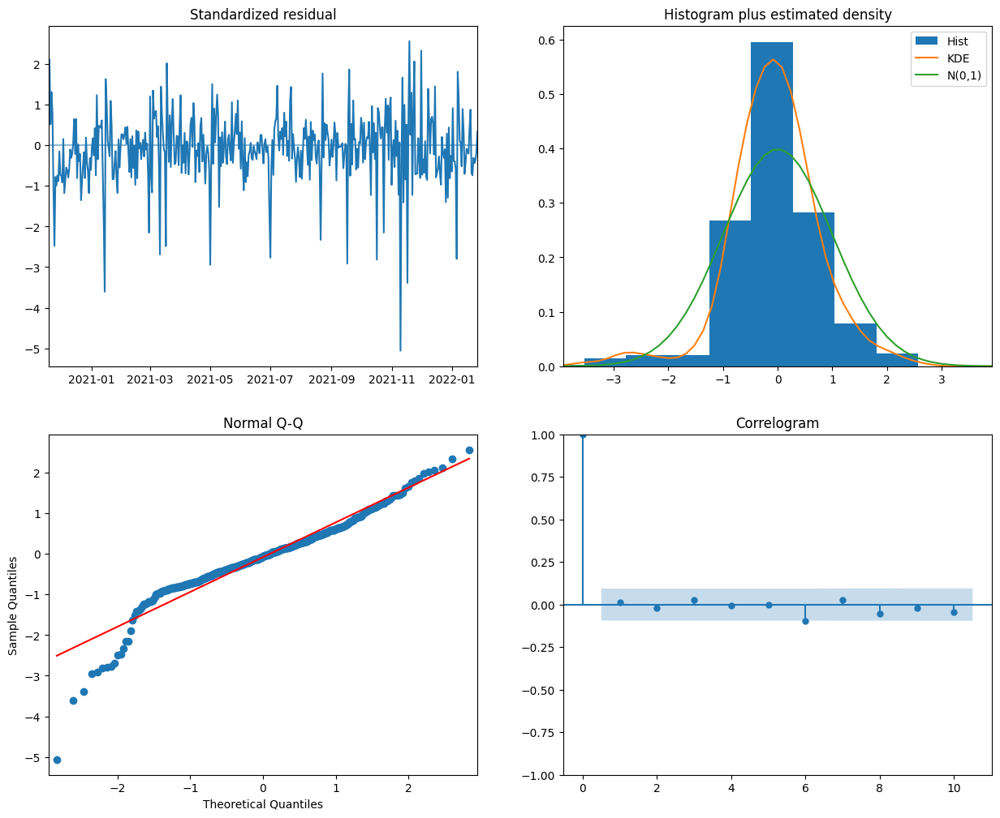

In [70]:
plot=model.plot_diagnostics(figsize=(15, 12))

In [73]:
forecasts = model.predict(110)
forecasts.index = pd.to_datetime(forecasts.index)
forecasts = forecasts.rename('Forecasts') 

forecasts


2022-01-28    6044.719921
2022-01-29    6061.542076
2022-01-30    6003.485087
2022-01-31    5462.285447
2022-02-01    4874.125240
                 ...     
2022-05-13    6506.974531
2022-05-14    6562.531060
2022-05-15    6547.363826
2022-05-16    6147.375540
2022-05-17    5702.900011
Freq: D, Name: Forecasts, Length: 110, dtype: float64

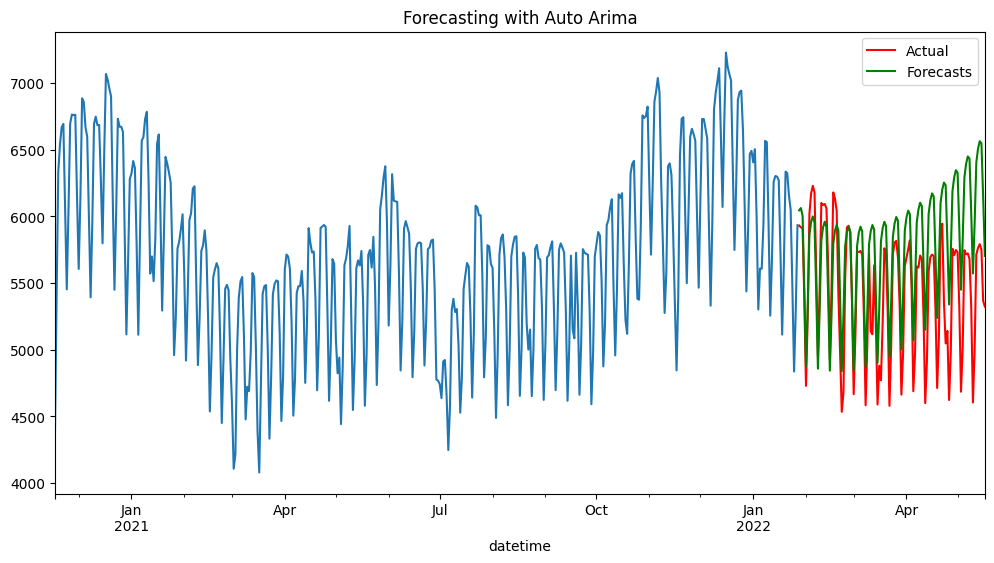

In [74]:
train.index = pd.to_datetime(train.index)
test.index = pd.to_datetime(test.index)

test = test.rename('Actual')

ax = train.plot()
ax = test.plot(legend=True, color='red', figsize=(12,6),title='Forecasting with Auto Arima')
ax = forecasts.plot(legend=True, color='green')

In [75]:
def MASE(training_series, testing_series, prediction_series):
    
    n = training_series.shape[0]
    d = np.abs(np.diff(training_series)).sum() / (n - 1)

    errors = np.abs(testing_series - prediction_series)
    return errors.mean() / d



In [76]:
erro_auto_arima = MASE(train, test, forecasts)
erro_auto_arima

1.063410724239091

MODELOS EXPONENTIAL SMOOTHING

In [77]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from statsmodels.tsa.exponential_smoothing.ets import ETSModel

ses_model_auto = SimpleExpSmoothing(train, initialization_method="estimated").fit()

In [78]:
ses_forecasts = ses_model_auto.forecast(110)

print(MASE(train,test,ses_forecasts))

1.467365564181249


<AxesSubplot:title={'center':'Forecasting with SES'}, xlabel='datetime'>

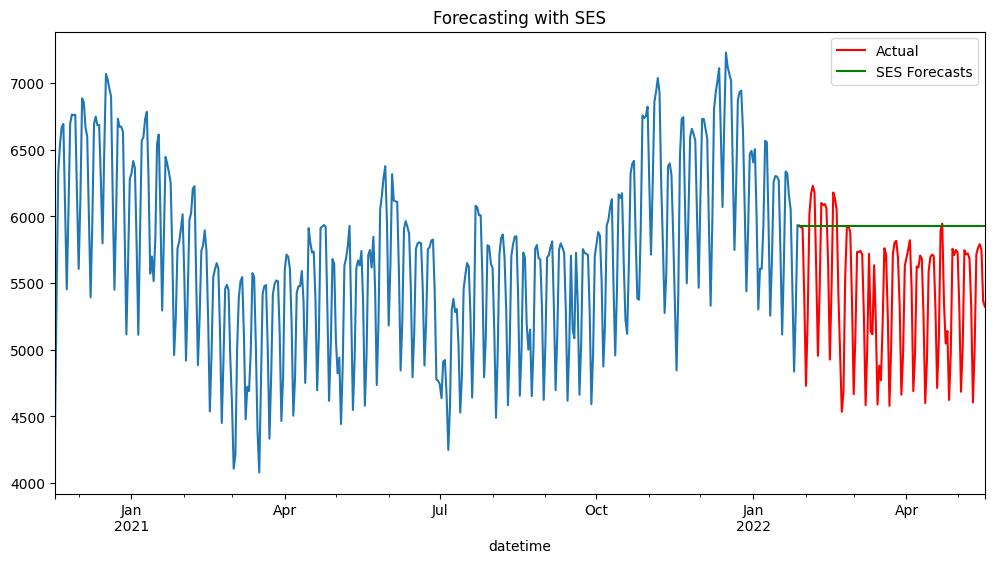

In [79]:
ses_forecasts = pd.Series(ses_forecasts, index=test.index).rename('SES Forecasts')
ax = train.plot()
ax = test.plot(legend=True,color='red', figsize=(12,6),title='Forecasting with SES')
ses_forecasts.plot(legend=True, color='green')

In [82]:
# Holt’s Winters Seasonal Exponential Smoothing
es = ExponentialSmoothing(
    train,
    seasonal_periods=30,
    trend="add",
    seasonal="add",
    use_boxcox=False,
    initialization_method="estimated",
).fit()

forecasts_es = es.forecast(110).rename("Holt’s Winters Seasonal Exponential Smoothing")

/Users/filipemattar/Desktop/ML/venv_ml/lib/python3.7/site-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


2.78048779326869


<AxesSubplot:title={'center':'Forecasting with ES'}, xlabel='datetime'>

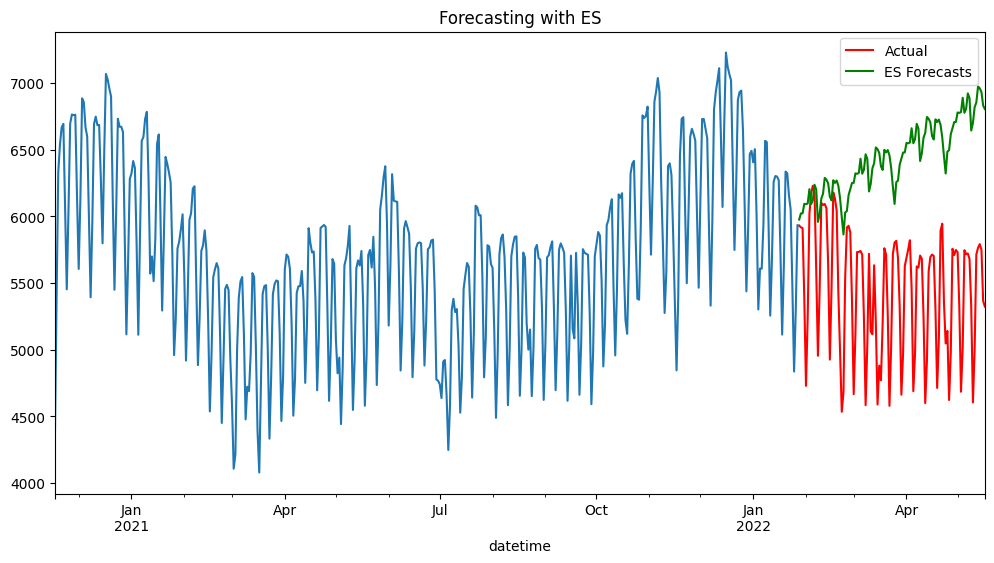

In [83]:
print(MASE(train,test,forecasts_es))

forecasts_es = forecasts_es.rename('ES Forecasts')
ax = train.plot()
ax = test.plot(legend=True,color='red', figsize=(12,6),title='Forecasting with ES')
forecasts_es.plot(legend=True, color='green')

SUPERVISED LEARNING

In [114]:
def MultivariateTDE(data: pd.DataFrame,
                    k: int,
                    horizon: int,
                    target_col: str, drop_na: bool = True):
    """
    time delay embedding for mv time series

    :param data: multivariate time series as pd.DF
    :param k: embedding dimension (applied to all cols)
    :param horizon: forecasting horizon
    :param target_col: string denoting the target column

    :return: trainable data set
    """

    iter_over_k = list(range(k, 0, -1))

    X_cols = []
    for col in data.columns:
        # input sequence (t-n, ... t-1)
        X, col_iter = [], []
        for i in iter_over_k:
            X.append(data[col].shift(i))

        X = pd.concat(X, axis=1)
        X.columns = [f'{col}-{j-1}' for j in iter_over_k]
        X_cols.append(X)

    X_cols = pd.concat(X_cols, axis=1)

    # forecast sequence (t, t+1, ... t+n)
    y = []
    for i in range(0, horizon):
        y.append(data[target_col].shift(-i))

    y = pd.concat(y, axis=1)
    y.columns = [f'{target_col}+{i}' for i in range(1, horizon + 1)]

    data_set = pd.concat([X_cols, y], axis=1)

    if drop_na:
        data_set = data_set.dropna()

    return data_set


In [115]:
def UnivariateTDE(data: pd.Series, k: int, horizon: int, drop_na: bool = True):
    """
    time delay embedding for mv time series

    :param data: multivariate time series as pd.DF
    :param k: embedding dimension (applied to all cols)
    :param horizon: forecasting horizon
    :param target_col: string denoting the target column

    :return: trainable data set
    """

    s = pd.DataFrame({'t': data})
    df = MultivariateTDE(data=s, k=k, horizon=horizon, target_col='t')
    if drop_na:
        df = df.dropna().reset_index(drop=True)
    else:
        df = df.reset_index(drop=True)

    return df

In [116]:
series_df = UnivariateTDE(data=series, k=20, horizon=1)

In [117]:
series_df.head()

,t-19,t-18,t-17,t-16,t-15,t-14,t-13,t-12,t-11,t-10,...,t-8,t-7,t-6,t-5,t-4,t-3,t-2,t-1,t-0,t+1
0,4294.687500,5373.125000,6329.000000,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,...,6758.000000,6761.416667,6159.000000,5605.333333,6134.000000,6884.000000,6855.291667,6666.666667,6596.750000,5977.166667
1,5373.125000,6329.000000,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,...,6761.416667,6159.000000,5605.333333,6134.000000,6884.000000,6855.291667,6666.666667,6596.750000,5977.166667,5392.750000
2,6329.000000,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,...,6159.000000,5605.333333,6134.000000,6884.000000,6855.291667,6666.666667,6596.750000,5977.166667,5392.750000,5955.916667
3,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,6761.416667,...,5605.333333,6134.000000,6884.000000,6855.291667,6666.666667,6596.750000,5977.166667,5392.750000,5955.916667,6692.916667
4,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,6761.416667,6159.000000,...,6134.000000,6884.000000,6855.291667,6666.666667,6596.750000,5977.166667,5392.750000,5955.916667,6692.916667,6746.916667


In [118]:
from sklearn.model_selection import train_test_split

# separando as variáveis explicativas
X = series_df.drop('t+1', axis=1)
y = series_df['t+1']

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False)

In [119]:
X_train.shape

(368, 20)

In [120]:
X_test.shape

(159, 20)

Usando RANDOM FOREST

In [121]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error

In [122]:
cv = TimeSeriesSplit(n_splits=5)

In [123]:
rf = RandomForestRegressor(random_state=42)

In [124]:
rf_params = {
    'n_estimators': [50, 100, 150],
    'max_depth': [2, 5, 9, 10],
    'min_samples_split': [10, 50, 100],
    'min_samples_leaf': [1, 5, 10],
}


In [125]:
rf_search = RandomizedSearchCV(rf, rf_params, n_iter=10, scoring='neg_mean_absolute_error', cv=cv, random_state=42)

In [126]:
rf_search.fit(X_train, y_train)

RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                   estimator=RandomForestRegressor(random_state=42),
                   param_distributions={'max_depth': [2, 5, 9, 10],
                                        'min_samples_leaf': [1, 5, 10],
                                        'min_samples_split': [10, 50, 100],
                                        'n_estimators': [50, 100, 150]},
                   random_state=42, scoring='neg_mean_absolute_error')

In [128]:
forecasts = rf_search.predict(X_test)
forecasts[:10]

array([6735.75792071, 6851.73286816, 6859.01884129, 6172.01521558,
       5666.29477373, 6114.90392379, 6806.119089  , 6915.62394286,
       6900.49129869, 6911.39028133])

In [129]:
MASE(y_train, y_test, forecasts)

0.4393678438327763

In [133]:
#Calculando Mean Absolute Error RandomForest
mae_rf = mean_absolute_error(y_test, forecasts)
print(mae_rf)

156.31936252795043


<AxesSubplot:title={'center':'Forecasting with RF'}>

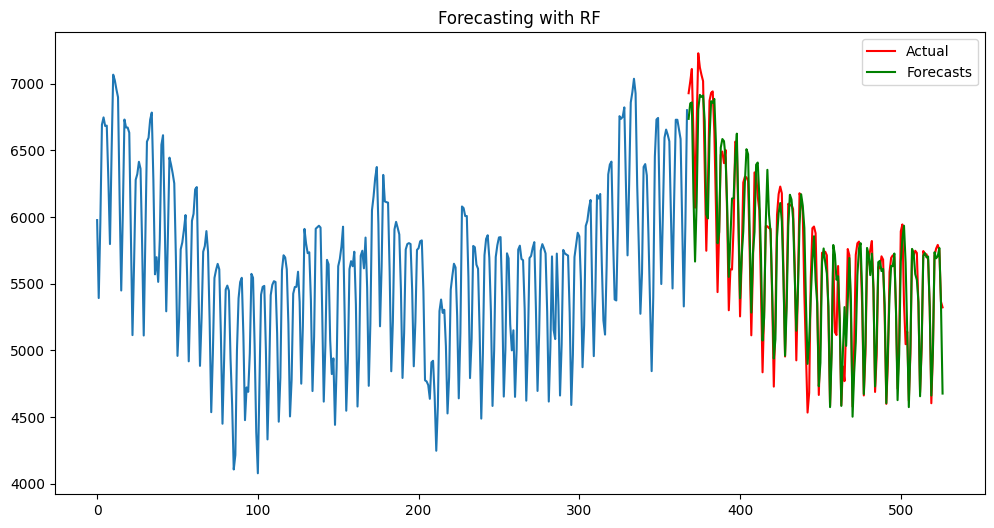

In [130]:
y_test = y_test.rename('Actual')
forecasts = pd.Series(forecasts, index=y_test.index).rename('Forecasts')
ax = y_train.plot()
ax = y_test.plot(legend=True,color='red', figsize=(12,6),title='Forecasting with RF')
forecasts.plot(legend=True, color='green')

XGBOOST REGRESSOR

In [134]:
from xgboost import XGBRegressor

In [135]:
xgb_model = XGBRegressor(random_state=42)

In [136]:
xgb_params = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7, 10],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

In [137]:
xgb_search = RandomizedSearchCV(xgb_model, xgb_params, n_iter=10, scoring='neg_mean_absolute_error', cv=cv, random_state=42)

In [138]:
xgb_search.fit(X_train, y_train)

RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, gamma=None,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=...
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                         

In [139]:
forecasts_xgb = xgb_search.predict(X_test)

In [140]:
MASE(y_train, y_test, forecasts_xgb)

0.4803191368779047

In [141]:
#Calculando Mean Absolute Error XGB
mae_xgb = mean_absolute_error(y_test, forecasts_xgb)
print(mae_xgb)

170.889113394712


<AxesSubplot:title={'center':'Forecasting with XGBoost'}>

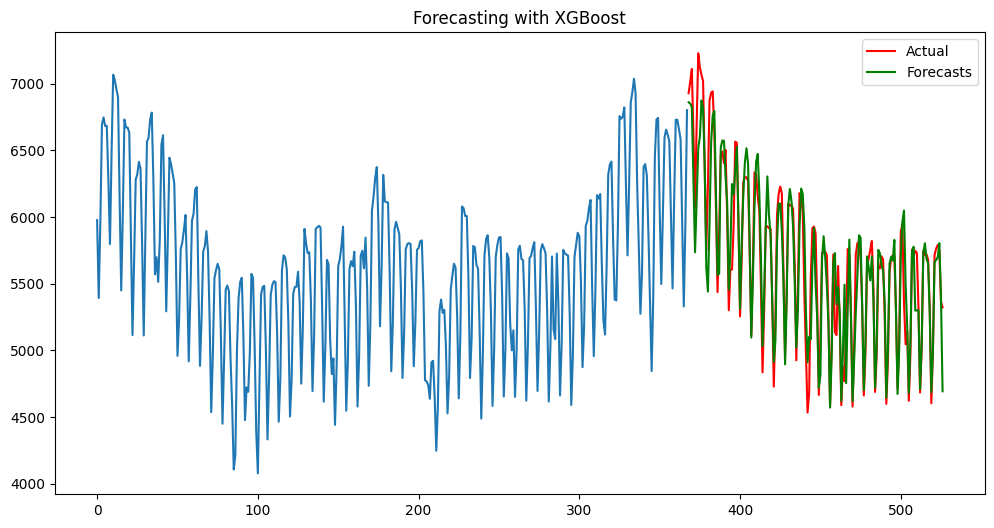

In [142]:
y_test = y_test.rename('Actual')
forecasts_xgb = pd.Series(forecasts_xgb, index=y_test.index).rename('Forecasts')
ax = y_train.plot()
ax = y_test.plot(legend=True,color='red', figsize=(12,6),title='Forecasting with XGBoost')
forecasts_xgb.plot(legend=True, color='green')

LIGHTGBM

In [143]:
from lightgbm import LGBMRegressor

In [144]:
lgbm_model = LGBMRegressor(random_state=42)

In [145]:
lgbm_params = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

In [146]:
lgbm_search = RandomizedSearchCV(lgbm_model, lgbm_params, n_iter=10, scoring='neg_mean_absolute_error', cv=cv, random_state=42)

In [147]:
lgbm_search.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 63, number of used features: 20
[LightGBM] [Info] Start training from score 6106.864413
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                   estimator=LGBMRegressor(random_state=42),
                   param_distributions={'colsample_bytree': [0.8, 0.9, 1.0],
                                        'learning_rate': [0.01, 0.1, 0.3],
                                        'max_depth': [3, 5, 7],
                                        'n_estimators': [100, 500, 1000],
                                        'subsample': [0.8, 0.9, 1.0]},
                   random_state=42, scoring='neg_mean_absolute_error')

In [148]:
forecasts_lgbm = lgbm_search.predict(X_test)

In [149]:
MASE(y_train, y_test, forecasts_lgbm)

0.4559240124711879

In [150]:
#Calculando Mean Absolute Error LGBM
mae_lgbm = mean_absolute_error(y_test, forecasts_lgbm)
print(mae_lgbm)

162.20975656517717


<AxesSubplot:title={'center':'Forecasting with LGBM'}>

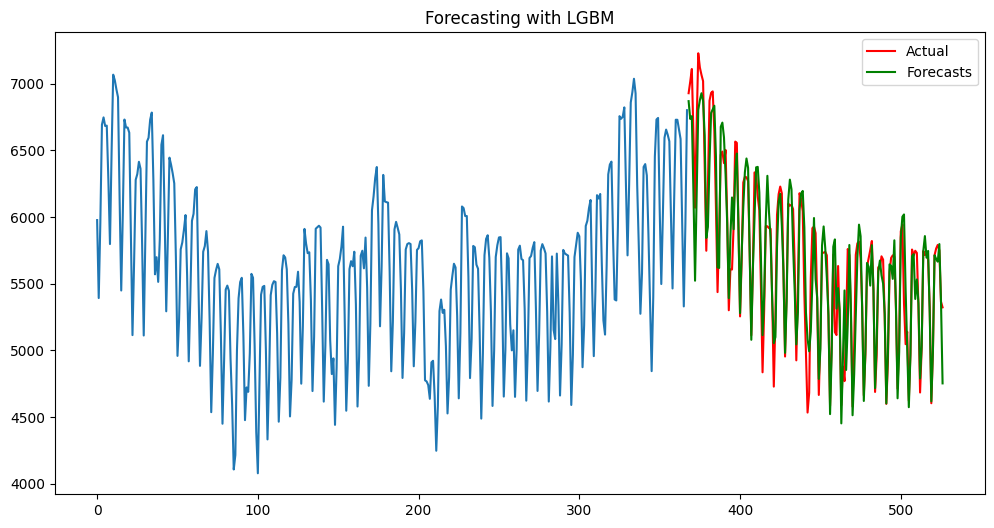

In [151]:
y_test = y_test.rename('Actual')
forecasts_lgbm = pd.Series(forecasts_lgbm, index=y_test.index).rename('Forecasts')
ax = y_train.plot()
ax = y_test.plot(legend=True,color='red', figsize=(12,6),title='Forecasting with LGBM')
forecasts_lgbm.plot(legend=True, color='green')

PREVISOES DE LONGO PRAZO

In [152]:
# prever os valores da carga nos próximos 20 dias com base nos últimos 20
series_long = UnivariateTDE(data=series, k=20, horizon=20)

series_long.head()

,t-19,t-18,t-17,t-16,t-15,t-14,t-13,t-12,t-11,t-10,...,t+11,t+12,t+13,t+14,t+15,t+16,t+17,t+18,t+19,t+20
0,4294.687500,5373.125000,6329.000000,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,...,7066.916667,7025.333333,6957.416667,6898.250000,6132.708333,5449.291667,6034.208333,6730.708333,6671.166667,6670.916667
1,5373.125000,6329.000000,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,...,7025.333333,6957.416667,6898.250000,6132.708333,5449.291667,6034.208333,6730.708333,6671.166667,6670.916667,6632.125000
2,6329.000000,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,...,6957.416667,6898.250000,6132.708333,5449.291667,6034.208333,6730.708333,6671.166667,6670.916667,6632.125000,5883.083333
3,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,6761.416667,...,6898.250000,6132.708333,5449.291667,6034.208333,6730.708333,6671.166667,6670.916667,6632.125000,5883.083333,5114.833333
4,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,6761.416667,6159.000000,...,6132.708333,5449.291667,6034.208333,6730.708333,6671.166667,6670.916667,6632.125000,5883.083333,5114.833333,5656.625000


In [153]:
is_future = series_long.columns.str.contains('\+')
X = series_long.iloc[:,~is_future]
Y = series_long.iloc[:,is_future]

X.head()

,t-19,t-18,t-17,t-16,t-15,t-14,t-13,t-12,t-11,t-10,t-9,t-8,t-7,t-6,t-5,t-4,t-3,t-2,t-1,t-0
0,4294.687500,5373.125000,6329.000000,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,6761.416667,6159.000000,5605.333333,6134.000000,6884.000000,6855.291667,6666.666667,6596.750000
1,5373.125000,6329.000000,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,6761.416667,6159.000000,5605.333333,6134.000000,6884.000000,6855.291667,6666.666667,6596.750000,5977.166667
2,6329.000000,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,6761.416667,6159.000000,5605.333333,6134.000000,6884.000000,6855.291667,6666.666667,6596.750000,5977.166667,5392.750000
3,6538.708333,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,6761.416667,6159.000000,5605.333333,6134.000000,6884.000000,6855.291667,6666.666667,6596.750000,5977.166667,5392.750000,5955.916667
4,6666.208333,6692.583333,6088.666667,5452.250000,6040.291667,6694.708333,6762.833333,6758.000000,6761.416667,6159.000000,5605.333333,6134.000000,6884.000000,6855.291667,6666.666667,6596.750000,5977.166667,5392.750000,5955.916667,6692.916667


In [154]:
Y.head()

,t+1,t+2,t+3,t+4,t+5,t+6,t+7,t+8,t+9,t+10,t+11,t+12,t+13,t+14,t+15,t+16,t+17,t+18,t+19,t+20
0,5977.166667,5392.750000,5955.916667,6692.916667,6746.916667,6682.416667,6685.375000,6277.833333,5797.416667,6485.833333,7066.916667,7025.333333,6957.416667,6898.250000,6132.708333,5449.291667,6034.208333,6730.708333,6671.166667,6670.916667
1,5392.750000,5955.916667,6692.916667,6746.916667,6682.416667,6685.375000,6277.833333,5797.416667,6485.833333,7066.916667,7025.333333,6957.416667,6898.250000,6132.708333,5449.291667,6034.208333,6730.708333,6671.166667,6670.916667,6632.125000
2,5955.916667,6692.916667,6746.916667,6682.416667,6685.375000,6277.833333,5797.416667,6485.833333,7066.916667,7025.333333,6957.416667,6898.250000,6132.708333,5449.291667,6034.208333,6730.708333,6671.166667,6670.916667,6632.125000,5883.083333
3,6692.916667,6746.916667,6682.416667,6685.375000,6277.833333,5797.416667,6485.833333,7066.916667,7025.333333,6957.416667,6898.250000,6132.708333,5449.291667,6034.208333,6730.708333,6671.166667,6670.916667,6632.125000,5883.083333,5114.833333
4,6746.916667,6682.416667,6685.375000,6277.833333,5797.416667,6485.833333,7066.916667,7025.333333,6957.416667,6898.250000,6132.708333,5449.291667,6034.208333,6730.708333,6671.166667,6670.916667,6632.125000,5883.083333,5114.833333,5656.625000


In [155]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, shuffle=False)

In [156]:
from sklearn.linear_model import Ridge
model_long = Ridge()
model_long.fit(X_train, Y_train)

Ridge()

In [157]:
forecasts_direto = model_long.predict(X_test)
print(forecasts_direto[:5])
forecasts_direto = pd.DataFrame(forecasts_direto, columns = Y_test.columns)
forecasts_direto.head()

[[6689.88873484 6695.7187772  6069.89045419 5647.90259447 5551.94583679
  5862.02801968 6444.84160397 6485.58999264 6378.81457982 5968.4278017
  5390.57375712 5205.53697998 5625.86388835 6179.09810876 6340.26087989
  6327.38115364 5880.51080155 5380.90263444 5215.78075561 5616.77599371]
 [6616.61621379 6096.46606947 5658.56290986 5549.06156455 5903.68191384
  6446.84888165 6420.76733597 6371.24615477 6080.0496294  5530.37650895
  5321.42822403 5701.72141644 6215.45529972 6281.36367036 6259.07323242
  5943.40119953 5489.4457333  5305.91456405 5632.81711765 6191.45830943]
 [6033.83728082 5620.42193902 5522.44292369 5879.70748851 6440.51276079
  6419.07079352 6341.50775164 6044.61651208 5503.37982518 5298.6701613
  5684.96592864 6213.83521991 6290.84816446 6247.58231834 5926.28768764
  5481.16104931 5298.84111904 5628.4543984  6207.22761324 6498.50313527]
 [5611.94464387 5567.5294575  5906.30753174 6453.63647277 6459.59250293
  6355.38970723 6025.40539794 5525.32183408 5396.9800438  5796.

,t+1,t+2,t+3,t+4,t+5,t+6,t+7,t+8,t+9,t+10,t+11,t+12,t+13,t+14,t+15,t+16,t+17,t+18,t+19,t+20
0,6689.888735,6695.718777,6069.890454,5647.902594,5551.945837,5862.028020,6444.841604,6485.589993,6378.814580,5968.427802,5390.573757,5205.536980,5625.863888,6179.098109,6340.260880,6327.381154,5880.510802,5380.902634,5215.780756,5616.775994
1,6616.616214,6096.466069,5658.562910,5549.061565,5903.681914,6446.848882,6420.767336,6371.246155,6080.049629,5530.376509,5321.428224,5701.721416,6215.455300,6281.363670,6259.073232,5943.401200,5489.445733,5305.914564,5632.817118,6191.458309
2,6033.837281,5620.421939,5522.442924,5879.707489,6440.512761,6419.070794,6341.507752,6044.616512,5503.379825,5298.670161,5684.965929,6213.835220,6290.848164,6247.582318,5926.287688,5481.161049,5298.841119,5628.454398,6207.227613,6498.503135
3,5611.944644,5567.529457,5906.307532,6453.636473,6459.592503,6355.389707,6025.405398,5525.321834,5396.980044,5796.093495,6304.129585,6353.297684,6280.141743,5902.937660,5454.530654,5357.844580,5717.554647,6281.067756,6517.154875,6479.010985
4,5394.303862,5870.686300,6420.655914,6422.904578,6372.035800,6006.547413,5413.609682,5333.613222,5853.317132,6399.844180,6436.170858,6333.015419,5929.179288,5370.516547,5257.736298,5746.868350,6354.166034,6578.763818,6488.063848,5908.569499


In [158]:
error_by_horizon_dir = {}
for h in Y_test.columns:
    error_by_horizon_dir[h] = mean_absolute_error(Y_test[h], forecasts_direto[h])
    
error_by_horizon_dir

{'t+1': 125.18275558790013,
 't+2': 193.76525689081433,
 't+3': 205.36917423702187,
 't+4': 210.64468982775165,
 't+5': 212.8396767733196,
 't+6': 212.57750112103247,
 't+7': 208.98957329654928,
 't+8': 224.6539104510523,
 't+9': 238.41077026819133,
 't+10': 235.77296564118663,
 't+11': 234.59427334422466,
 't+12': 237.97555678152108,
 't+13': 234.14100398074473,
 't+14': 229.33702501480545,
 't+15': 234.90247555442176,
 't+16': 240.39318362307606,
 't+17': 235.3035601649632,
 't+18': 232.4127578968806,
 't+19': 227.63580122247362,
 't+20': 225.59112070765087}

In [159]:
pd.Series(error_by_horizon_dir).mean()

220.02465161927904

<AxesSubplot:>

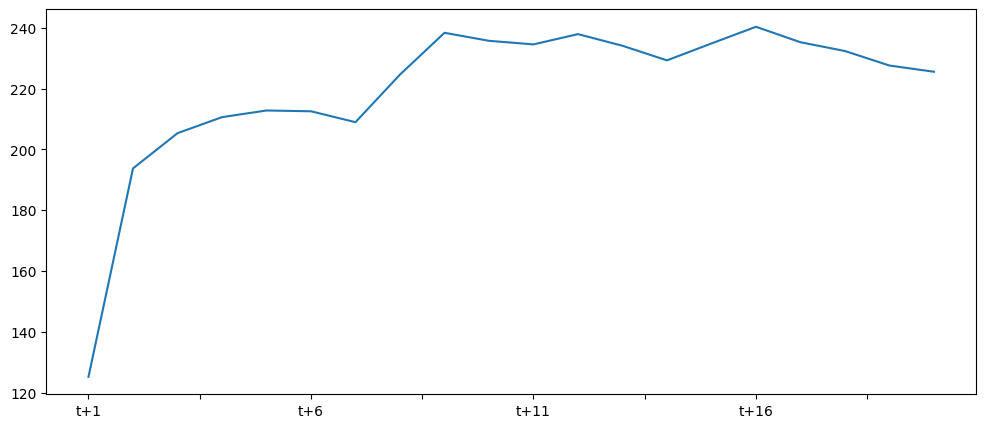

In [160]:
pd.Series(error_by_horizon_dir).plot(figsize=(12,5))

In [161]:
from sklearn.multioutput import RegressorChain

model_dirrec = RegressorChain(Ridge())
model_dirrec.fit(X_train, Y_train)

RegressorChain(base_estimator=Ridge())

In [162]:
forecasts_dirrec = model_dirrec.predict(X_test)
forecasts_dirrec = pd.DataFrame(forecasts_dirrec, columns = Y_test.columns)
forecasts_dirrec.head()

,t+1,t+2,t+3,t+4,t+5,t+6,t+7,t+8,t+9,t+10,t+11,t+12,t+13,t+14,t+15,t+16,t+17,t+18,t+19,t+20
0,6689.888735,6695.718777,6069.890454,5647.902594,5551.945837,5862.028020,6444.841604,6485.589993,6378.814580,5968.427802,5390.573757,5205.536980,5625.863888,6179.098109,6340.260880,6327.381154,5880.510802,5380.902634,5215.780756,5616.775994
1,6616.616214,6096.466069,5658.562910,5549.061565,5903.681914,6446.848882,6420.767336,6371.246155,6080.049629,5530.376509,5321.428224,5701.721416,6215.455300,6281.363670,6259.073232,5943.401200,5489.445733,5305.914564,5632.817118,6191.458309
2,6033.837281,5620.421939,5522.442924,5879.707489,6440.512761,6419.070794,6341.507752,6044.616512,5503.379825,5298.670161,5684.965929,6213.835220,6290.848164,6247.582318,5926.287688,5481.161049,5298.841119,5628.454398,6207.227613,6498.503135
3,5611.944644,5567.529457,5906.307532,6453.636473,6459.592503,6355.389707,6025.405398,5525.321834,5396.980044,5796.093495,6304.129585,6353.297684,6280.141743,5902.937660,5454.530654,5357.844580,5717.554647,6281.067756,6517.154875,6479.010985
4,5394.303862,5870.686300,6420.655914,6422.904578,6372.035800,6006.547413,5413.609682,5333.613222,5853.317132,6399.844180,6436.170858,6333.015419,5929.179288,5370.516547,5257.736298,5746.868350,6354.166034,6578.763818,6488.063848,5908.569499


In [163]:
error_by_horizon_dr = {}
for h in Y_test.columns:
    error_by_horizon_dr[h] = mean_absolute_error(Y_test[h], forecasts_dirrec[h])
    
error_by_horizon_dr

{'t+1': 125.1827555879002,
 't+2': 193.7652568908144,
 't+3': 205.36917423702192,
 't+4': 210.64468982775193,
 't+5': 212.8396767733194,
 't+6': 212.57750112103193,
 't+7': 208.98957329654968,
 't+8': 224.65391045105213,
 't+9': 238.41077026819121,
 't+10': 235.77296564118677,
 't+11': 234.59427334422458,
 't+12': 237.97555678152142,
 't+13': 234.14100398074467,
 't+14': 229.33702501480502,
 't+15': 234.90247555442153,
 't+16': 240.39318362307552,
 't+17': 235.3035601649628,
 't+18': 232.41275789687955,
 't+19': 227.63580122247228,
 't+20': 225.59112070765016}

In [164]:
pd.Series(error_by_horizon_dr).mean()

220.02465161927884

TESTANDO OS MODELOS COM A TRANSOFRMAÇAO BOXCOX

ARIMA

In [181]:
import statsmodels.stats.api as sms
from statsmodels.formula.api import ols

from patsy import dmatrices


def het_tests(series: pd.Series, test: str) -> float:
    """
    Testing for heteroskedasticity using the White or Breusch-Pagan test
    :param series: Univariate time series as pd.Series
    :param test: String denoting the test. One of 'white' or 'breuschpagan'

    :return: p-value as a float.
    If the p-value is high, we accept the null hypothesis that there is no heteroscedastisticity
    """
    formula = 'value ~ time'
    assert test in ['white', 'breuschpagan'], 'Unknown test'

    series = series.reset_index(drop=True).reset_index()
    series.columns = ['time', 'value']
    series['time'] += 1

    olsr = ols(formula, series).fit()

    y, X = dmatrices(formula, series, return_type='dataframe')

    if test == 'white':
        _, p_value, _, _ = sms.het_white(olsr.resid, X)
    else:
        _, p_value, _, _ = sms.het_breuschpagan(olsr.resid, X)

    return p_value

In [182]:
p_value_W = het_tests(series, test='white')
p_value_W

0.045620294339859604

In [183]:
p_value_B = het_tests(series, test='breuschpagan')
p_value_B

0.015132567393807929

In [184]:
from scipy.stats import boxcox
from scipy.special import inv_boxcox


transformed_data, best_lambda = boxcox(series)

print(transformed_data[:5])
print(series.values[:5])
print(best_lambda)

[189.56829721 215.07168947 235.83594417 240.20137762 242.82531484]
[4294.6875     5373.125      6329.         6538.70833333 6666.20833333]
0.5584578534496071


In [185]:
# transformar o array em uma série
index=pd.date_range('2020-11-17', periods=len(transformed_data))

series_t = pd.Series(transformed_data, index=index)

series_t

2020-11-17    189.568297
2020-11-18    215.071689
2020-11-19    235.835944
2020-11-20    240.201378
2020-11-21    242.825315
                 ...    
2022-05-13    223.739663
2022-05-14    224.334509
2022-05-15    223.449067
2022-05-16    214.906349
2022-05-17    213.942066
Freq: D, Length: 547, dtype: float64

<AxesSubplot:>

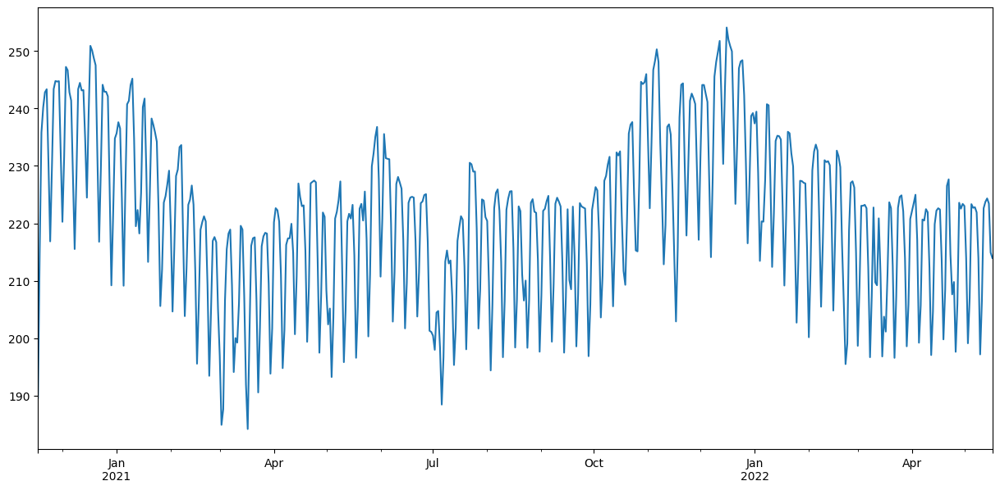

In [186]:
series_t.plot(figsize=(15,7))

In [187]:
# divisao entre treino e validacao
from sklearn.model_selection import train_test_split

train_t, test_t = train_test_split(series_t, shuffle=False, test_size=0.2)

In [188]:
model_t = pm.auto_arima(train_t, m=7, trace=True, suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[7] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=3255.315, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=2683.269, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=2889.730, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=3253.347, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=3223.646, Time=0.08 sec
 ARIMA(1,1,0)(2,0,0)[7] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(1,0,1)[7] intercept   : AIC=2542.063, Time=0.42 sec
 ARIMA(1,1,0)(0,0,1)[7] intercept   : AIC=2982.440, Time=0.19 sec
 ARIMA(1,1,0)(2,0,1)[7] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,0)(1,0,2)[7] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,2)[7] intercept   : AIC=2864.801, Time=0.45 sec
 ARIMA(1,1,0)(2,0,2)[7] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,1,0)(1,0,1)[7] intercept   : AIC=2548.794, Time=0.35 sec
 ARIMA(2,1,0)(1,0,1)[7] intercept   : AIC=2472.832, Time=0

In [190]:
model_t.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                                      y   No. Observations:                  437
Model:             SARIMAX(4, 1, 0)x(1, 0, [1, 2], 7)   Log Likelihood               -1210.065
Date:                                Tue, 23 Jul 2024   AIC                           2436.130
Time:                                        07:46:02   BIC                           2468.751
Sample:                                    11-17-2020   HQIC                          2449.004
                                         - 01-27-2022                                         
Covariance Type:                                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2469      0.037      6.699      0.000       0.175       0.319
ar.L2         -0.5148      0.036    -14.227      0.000      -0.586      -0.444
ar.L3          0.1503      0.056      2.663      0.008       0.040       0.261
ar.L4         -0.2690      0.042     -6.353      0.000      -0.352      -0.186
ar.S.L7        0.9985      0.001    982.883      0.000       0.997       1.001
ma.S.L7       -0.8064      0.030    -27.195      0.000      -0.865      -0.748
ma.S.L14      -0.1012      0.038     -2.689      0.007      -0.175      -0.027
sigma2        14.3978      0.519     27.738      0.000      13.380      15.415
===================================================================================
Ljung-Box (L1) (Q):                   0.14   Jarque-Bera (JB):               724.25
Prob(Q):                              0.71   Prob(JB):                         0.00
Heteroskedasticity (H):               1.27   Skew:                            -1.25
Prob(H) (two-sided):                  0.15   Kurtosis:                         8.80
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

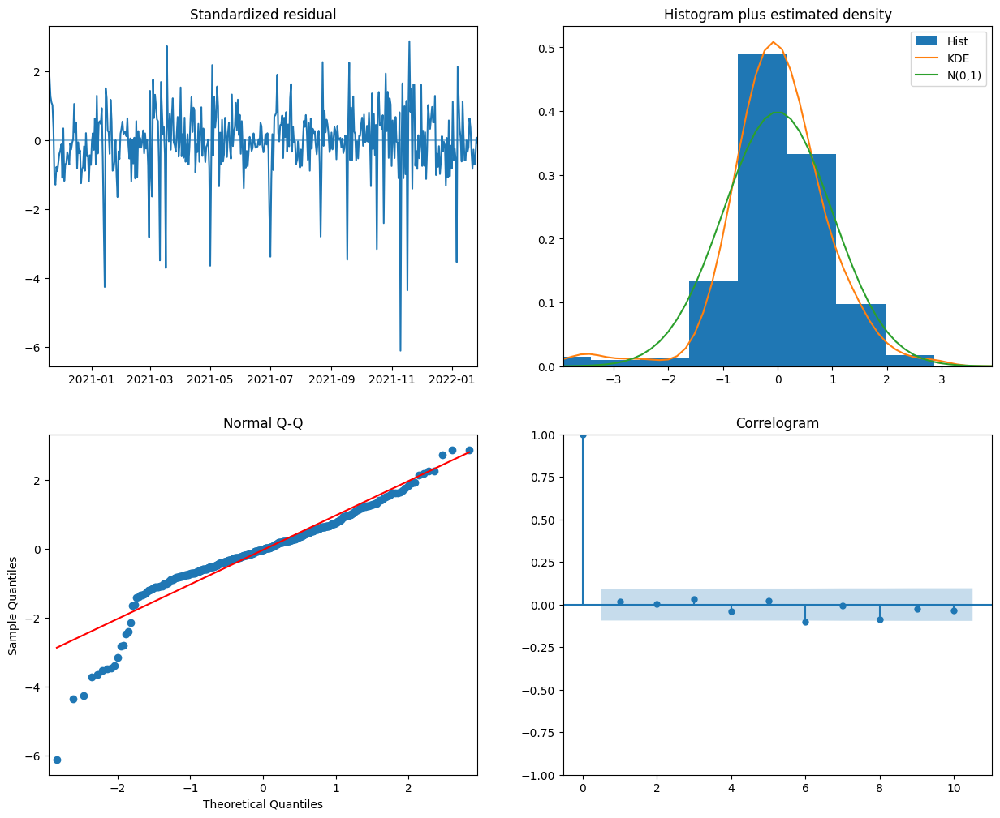

In [191]:
plot=model_t.plot_diagnostics(figsize=(15, 12))

In [192]:
forecasts = model_t.predict(int(len(test_t)))
forecasts.index = pd.to_datetime(forecasts.index)
forecasts = forecasts.rename('Forecasts') 

forecasts

2022-01-28    228.954023
2022-01-29    229.257735
2022-01-30    227.971377
2022-01-31    216.453303
2022-02-01    203.375765
                 ...    
2022-05-13    219.087310
2022-05-14    219.759829
2022-05-15    218.713473
2022-05-16    207.985171
2022-05-17    195.302275
Freq: D, Name: Forecasts, Length: 110, dtype: float64

In [193]:
original_forecasts = inv_boxcox(forecasts, best_lambda)
original_forecasts

2022-01-28    6004.549698
2022-01-29    6018.709151
2022-01-30    5958.838419
2022-01-31    5434.576266
2022-02-01    4865.326821
                 ...     
2022-05-13    5552.585373
2022-05-14    5582.894913
2022-05-15    5535.768519
2022-05-16    5062.793835
2022-05-17    4527.846462
Freq: D, Name: Forecasts, Length: 110, dtype: float64

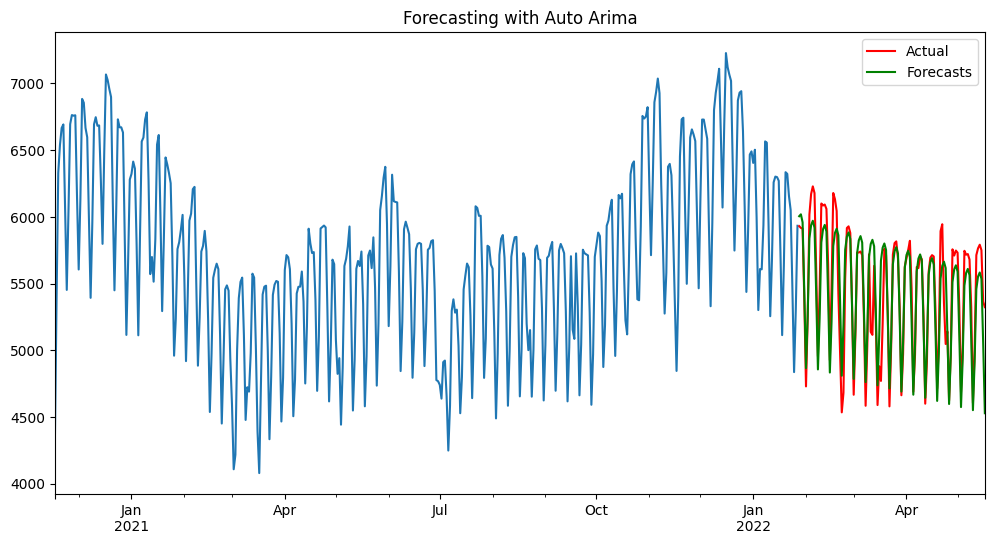

In [195]:
train.index = pd.to_datetime(train.index)
test.index = pd.to_datetime(test.index)

test_t = test_t.rename('Actual')

ax = inv_boxcox(train_t, best_lambda).plot()
ax = inv_boxcox(test_t, best_lambda).plot(legend=True, color='red', figsize=(12,6),title='Forecasting with Auto Arima')
ax = original_forecasts.plot(legend=True, color='green')

In [196]:
#revertendo
train_reverse = inv_boxcox(train_t, best_lambda)
test_reverse = inv_boxcox(test_t, best_lambda)

In [197]:
erro_auto_arima_bc = MASE(train_reverse, test_reverse, original_forecasts)
erro_auto_arima_bc

0.45249760393808597

HOLT WINTERS SEASONAL Exponential Smoothing

In [200]:
# Holt’s Winters Seasonal Exponential Smoothing
es_t = ExponentialSmoothing(
    train,
    seasonal_periods=7,
    trend="add",
    seasonal="add",
    use_boxcox=True, #TROCAMOS O PARAMETRO PARA TRUE PARA FAZER A TRANSFORMAÇAO DA SERIE
    initialization_method="estimated",
).fit()

forecasts_es_t = es_t.forecast(110).rename("Holt’s Winters Seasonal Exponential Smoothing")

0.5998191557056743


<AxesSubplot:title={'center':'Forecasting with ES'}, xlabel='datetime'>

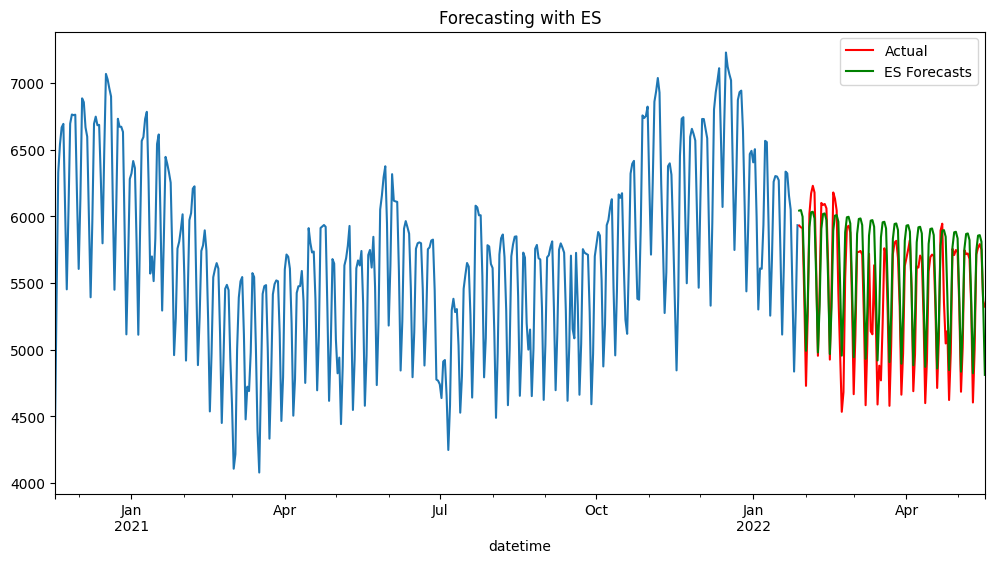

In [201]:
print(MASE(train,test,forecasts_es_t))

forecasts_es_t = forecasts_es_t.rename('ES Forecasts')
ax = train.plot()
ax = test.plot(legend=True,color='red', figsize=(12,6),title='Forecasting with ES')
forecasts_es_t.plot(legend=True, color='green')

SUPERVISED LEARNING COM BOXCOX

In [202]:
series_df_bxc = UnivariateTDE(data=series_t, k=20, horizon=1)

In [203]:
series_df_bxc.head()

,t-19,t-18,t-17,t-16,t-15,t-14,t-13,t-12,t-11,t-10,...,t-8,t-7,t-6,t-5,t-4,t-3,t-2,t-1,t-0,t+1
0,189.568297,215.071689,235.835944,240.201378,242.825315,243.365335,230.753677,216.849384,229.720062,243.408803,...,244.700681,244.770268,232.250024,220.256663,231.719016,247.256729,246.676178,242.834707,241.398645,228.365774
1,215.071689,235.835944,240.201378,242.825315,243.365335,230.753677,216.849384,229.720062,243.408803,244.799116,...,244.770268,232.250024,220.256663,231.719016,247.256729,246.676178,242.834707,241.398645,228.365774,215.513674
2,235.835944,240.201378,242.825315,243.365335,230.753677,216.849384,229.720062,243.408803,244.799116,244.700681,...,232.250024,220.256663,231.719016,247.256729,246.676178,242.834707,241.398645,228.365774,215.513674,227.908456
3,240.201378,242.825315,243.365335,230.753677,216.849384,229.720062,243.408803,244.799116,244.700681,244.770268,...,220.256663,231.719016,247.256729,246.676178,242.834707,241.398645,228.365774,215.513674,227.908456,243.372154
4,242.825315,243.365335,230.753677,216.849384,229.720062,243.408803,244.799116,244.700681,244.770268,232.250024,...,231.719016,247.256729,246.676178,242.834707,241.398645,228.365774,215.513674,227.908456,243.372154,244.474840


In [204]:
# separando as variáveis explicativas
X = series_df_bxc.drop('t+1', axis=1)
y = series_df_bxc['t+1']

# train test split
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X, y, test_size=0.3, shuffle=False)

In [215]:
tcv = TimeSeriesSplit(n_splits=5)

In [206]:
rf_model_t = RandomForestRegressor(random_state=42)
xgb_model_t = XGBRegressor(random_state=42)
lgbm_model_t = LGBMRegressor(random_state=42)

In [207]:
rf_params = {
    'n_estimators': [50, 100, 150],
    'max_depth': [2, 5, 9, 10],
    'min_samples_split': [10, 50, 100],
    'min_samples_leaf': [1, 5, 10],
}

xgb_params = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7, 10],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

lgbm_params = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

In [218]:
rf_tsearch = RandomizedSearchCV(rf_model_t, rf_params, n_iter=10, scoring='neg_mean_absolute_error', cv=tcv, random_state=42)

xgb_tsearch = RandomizedSearchCV(xgb_model_t, xgb_params, n_iter=10, scoring='neg_mean_absolute_error', cv=tcv, random_state=42)

lgbm_tsearch = RandomizedSearchCV(lgbm_model_t, lgbm_params, n_iter=10, scoring='neg_mean_absolute_error', cv=tcv, random_state=42)

In [219]:
rf_tsearch.fit(X_train_t, y_train_t)

xgb_tsearch.fit(X_train_t, y_train_t)

lgbm_tsearch.fit(X_train_t, y_train_t)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 63, number of used features: 20
[LightGBM] [Info] Start training from score 230.916071
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                   estimator=LGBMRegressor(random_state=42),
                   param_distributions={'colsample_bytree': [0.8, 0.9, 1.0],
                                        'learning_rate': [0.01, 0.1, 0.3],
                                        'max_depth': [3, 5, 7],
                                        'n_estimators': [100, 500, 1000],
                                        'subsample': [0.8, 0.9, 1.0]},
                   random_state=42, scoring='neg_mean_absolute_error')

In [225]:
forecasts_rft = rf_tsearch.predict(X_test_t)
forecasts_xgbt = xgb_tsearch.predict(X_test_t)
forecasts_lgbmt = lgbm_tsearch.predict(X_test_t)


print('MASE Random Forest (boxcox): ' + str(MASE(y_train_t, y_test_t, forecasts_rft)))
print('MASE XGB (boxcox): ' + str(MASE(y_train_t, y_test_t, forecasts_xgbt)))
print('MASE LGBM (boxcox): ' + str(MASE(y_train_t, y_test_t, forecasts_lgbmt)))

MASE Random Forest (boxcox): 0.431580462259938
MASE XGB (boxcox): 0.474793924789135
MASE LGBM (boxcox): 0.43923661596307056


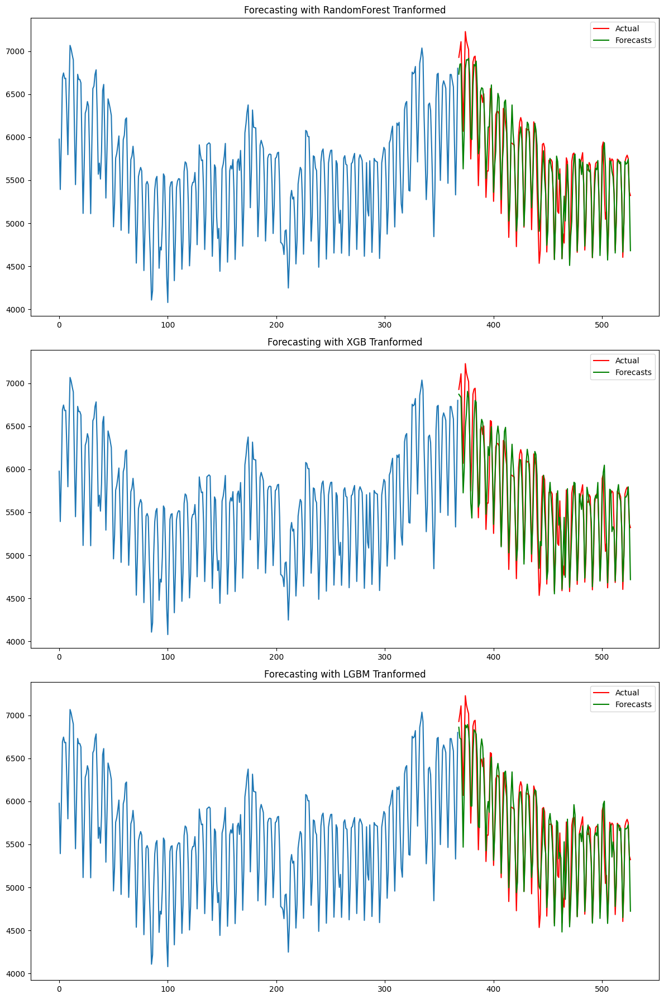

In [261]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(3, 1, figsize=(12, 18))


y_test_t = y_test_t.rename('Actual')
forecasts_rft = pd.Series(forecasts_rft, index=y_test_t.index).rename('Forecasts')
inv_boxcox(y_train_t, best_lambda).plot(ax=axs[0])
inv_boxcox(y_test_t, best_lambda).plot(ax=axs[0], legend=True, color='red')
inv_boxcox(forecasts_rft, best_lambda).plot(ax=axs[0], legend=True, color='green')
axs[0].set_title('Forecasting with RandomForest Tranformed')


y_test_t = y_test_t.rename('Actual')
forecasts_xgbt = pd.Series(forecasts_xgbt, index=y_test_t.index).rename('Forecasts')
inv_boxcox(y_train_t, best_lambda).plot(ax=axs[1])
inv_boxcox(y_test_t, best_lambda).plot(ax=axs[1], legend=True, color='red')
inv_boxcox(forecasts_xgbt, best_lambda).plot(ax=axs[1], legend=True, color='green')
axs[1].set_title('Forecasting with XGB Tranformed')

y_test_t = y_test_t.rename('Actual')
forecasts_lgbmt = pd.Series(forecasts_lgbmt, index=y_test_t.index).rename('Forecasts')
inv_boxcox(y_train_t, best_lambda).plot(ax=axs[2])
inv_boxcox(y_test_t, best_lambda).plot(ax=axs[2], legend=True, color='red')
inv_boxcox(forecasts_lgbmt, best_lambda).plot(ax=axs[2], legend=True, color='green')
axs[2].set_title('Forecasting with LGBM Tranformed')

# Show the plot
plt.tight_layout()
plt.show()

CONSIDERAÇÕES FINAIS

- Os modelos ARIMA e Exponetial Smoothing apresentaram um desempenho melhor quando aplicado transformação BOXCOX;
- Já os modelos supervisionados (RandomForest, XGB e LGBM) apresentaram uma performance praticamente identica com e sem transformação e normalização dos dados.
- Com relação a previsões de longo prazo, o modelo tende a aumentar o erro medio a medida em que o horizonte de previsão aumenta.
- Percebe-se também que o modelo faz previsões com menor precisão em valores extremos da série.